In [63]:
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
import time
import tensorflow as tf
from IPython import display
import pandas as pd
import random
from sklearn.model_selection import train_test_split
%matplotlib inline

In [5]:
#Список изображений и классов
path_list = sorted(glob.glob('/tf/notebooks/code/tools/Courses/ImageProcessing/lesson8/lfw/*'))
images_list=[]   
images_class=[]
for i, val in enumerate(path_list):
    images_one_class_list= glob.glob(val + "/*")
    images_list += images_one_class_list
    images_class += [i]*len(images_one_class_list)

In [6]:
len(images_list)

13233

In [7]:
generator = tf.keras.Sequential([
    tf.keras.layers.Dense(128*7*7, activation='relu'),
    tf.keras.layers.Reshape((7, 7, 128)),
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(128, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),    
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(64, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),    
    tf.keras.layers.Conv2D(1, (3, 3), padding='same', activation='tanh'),
])

discriminator = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same'),
    tf.keras.layers.LeakyReLU(0.2),
    tf.keras.layers.Dropout(0.25),    
    tf.keras.layers.Conv2D(64, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(128, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(256, kernel_size=3, strides=(1, 1), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1),
])

In [24]:
#Функция для загрузки изображения
def load_img_one(image):

    #Загружаем и препроцессим изображения
    image = tf.io.read_file(image)
    image = tf.io.decode_png(image)
    image = tf.image.resize(image, (28,28))
    image = tf.image.rgb_to_grayscale(image)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = image / 255.0
    return image

def load_img(x, y):
    x_new = load_img_one(x)
    return x_new, y

In [25]:
def batch_img_gen(in_df, batch_size):
    out_x = []
    while True:
        for c_df in np.random.permutation(in_df):

            x = load_img_one(c_df[0])
            out_x += [x]
          
            if len(out_x) >= batch_size:
                yield np.stack(out_x, 0)
                out_x = []


In [26]:
full_df = pd.DataFrame()
full_df["path"] = images_list
full_df["class"]= images_class

In [27]:
x_train, x_test, y_train, y_test = train_test_split(full_df["path"], full_df["class"], train_size = 0.7)

train_df = pd.DataFrame()
test_df = pd.DataFrame()
train_df['x'] = x_train.values
train_df['y'] = y_train.values

#test_df['x'] = x_test.values
#test_df['y'] = y_test.values

In [28]:
BATCH_SIZE = 16
train_ds = batch_img_gen(train_df, BATCH_SIZE)
test_ds  = batch_img_gen(test_df, BATCH_SIZE)

(28, 28, 1)
(28, 28, 1)


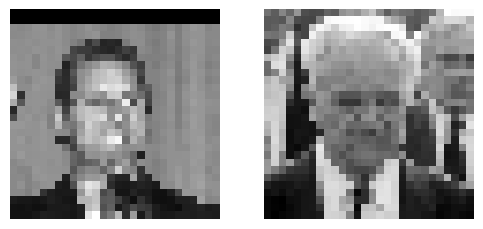

In [48]:
plt.figure(figsize=(6,6))
for im in train_ds:
       
    for i in range(2):
        
        print(im[i].shape)
        ax= plt.subplot(2, 2, i+1)
        plt.imshow((im[i]*255).astype("uint8"), cmap='gray')

        plt.axis("off")
    break    
   

In [64]:
INPUT_DIM = 100
NUM_EPOCHS = 2
HALF_BATCH_SIZE = 16
BATCH_SIZE = HALF_BATCH_SIZE * 2
LEARNING_RATE = 0.0002

from tensorflow.keras.optimizers.legacy import Adam

optimizer = Adam(LEARNING_RATE)
sigmoid_cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [66]:
def plot_digits(samples):
    fig = plt.figure(figsize=(10, 10))
    num = samples.shape[0]
    for j in range(num):
        ax = fig.add_subplot(8, 8, j+1)
        ax.imshow(samples[j, ...].reshape(28, 28), cmap='gray')
        plt.xticks([]), plt.yticks([])
    plt.show()

1/1 [==============================] - 0s 11ms/step
[Step  0] D Loss: 0.0045; G Loss: 0.9168
1/1 [==============================] - 0s 11ms/step


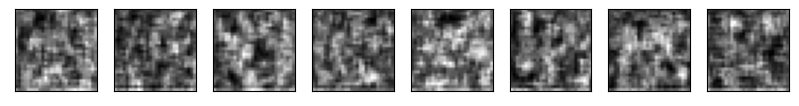

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 200] D Loss: 1.4311; G Loss: 0.1124
1/1 [==============================] - 0s 10ms/step


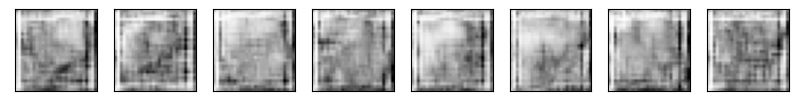

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 400] D Loss: 0.0613; G Loss: 1.9850
1/1 [==============================] - 0s 10ms/step


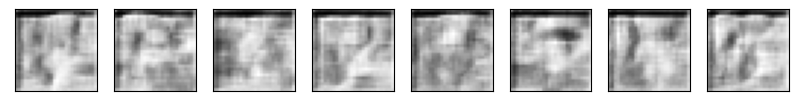

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 600] D Loss: 0.3634; G Loss: 0.6977
1/1 [==============================] - 0s 11ms/step


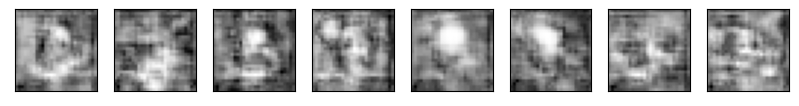

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 12ms/step
[Step 800] D Loss: 0.3739; G Loss: 3.4487
1/1 [==============================] - 0s 11ms/step


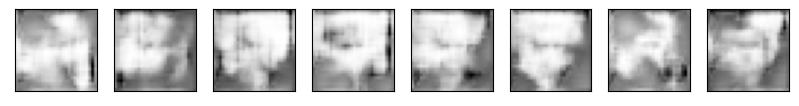

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 11ms/step
[Step 1000] D Loss: 0.5646; G Loss: 0.7733
1/1 [==============================] - 0s 10ms/step


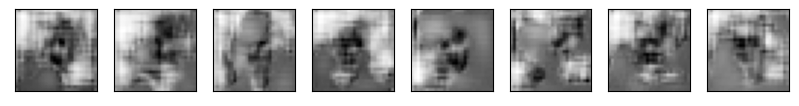

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 1200] D Loss: 0.2905; G Loss: 1.4958
1/1 [==============================] - 0s 10ms/step


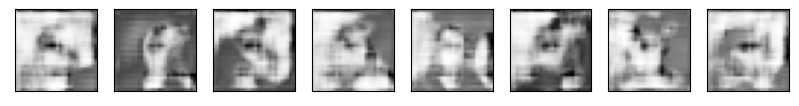

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 1400] D Loss: 1.0673; G Loss: 0.2227
1/1 [==============================] - 0s 11ms/step


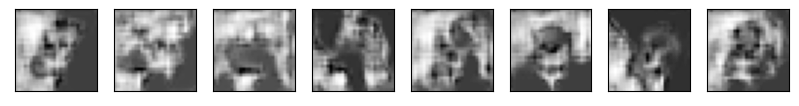

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 1600] D Loss: 0.8645; G Loss: 1.3068
1/1 [==============================] - 0s 10ms/step


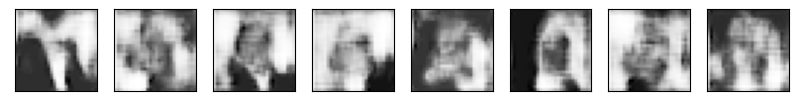

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 1800] D Loss: 1.3519; G Loss: 0.3416
1/1 [==============================] - 0s 11ms/step


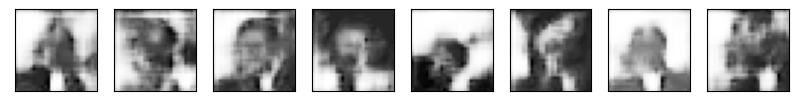

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 2000] D Loss: 0.4417; G Loss: 1.4978
1/1 [==============================] - 0s 10ms/step


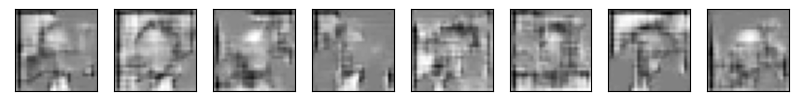

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 2200] D Loss: 0.7488; G Loss: 0.9169
1/1 [==============================] - 0s 10ms/step


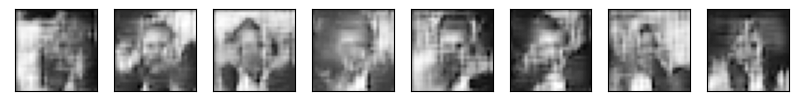

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 2400] D Loss: 0.7143; G Loss: 0.6677
1/1 [==============================] - 0s 10ms/step


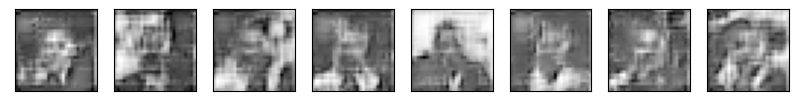

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 2600] D Loss: 0.3241; G Loss: 1.4277
1/1 [==============================] - 0s 10ms/step


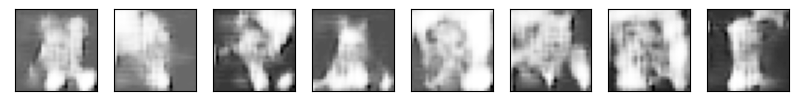

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 2800] D Loss: 0.8577; G Loss: 0.5885
1/1 [==============================] - 0s 10ms/step


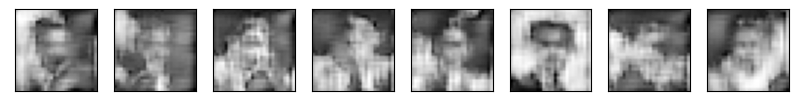

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 3000] D Loss: 0.3526; G Loss: 1.0558
1/1 [==============================] - 0s 11ms/step


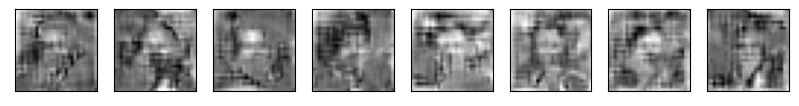

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 3200] D Loss: 0.4319; G Loss: 1.7982
1/1 [==============================] - 0s 10ms/step


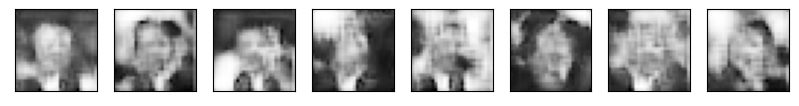

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 12ms/step
[Step 3400] D Loss: 0.8916; G Loss: 0.7879
1/1 [==============================] - 0s 11ms/step


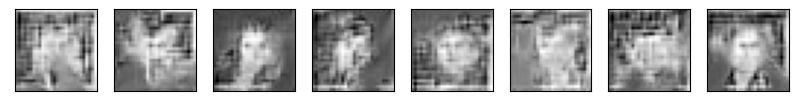

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 3600] D Loss: 1.2364; G Loss: 0.6949
1/1 [==============================] - 0s 10ms/step


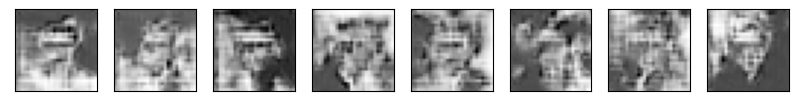

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 3800] D Loss: 0.7081; G Loss: 0.8270
1/1 [==============================] - 0s 10ms/step


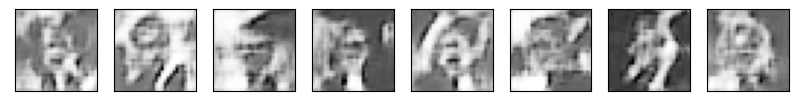

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 4000] D Loss: 0.6154; G Loss: 1.2127
1/1 [==============================] - 0s 10ms/step


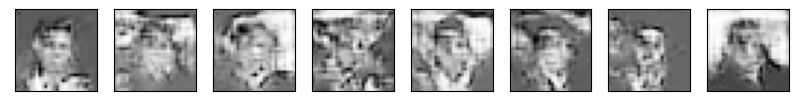

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 4200] D Loss: 0.5494; G Loss: 1.3281
1/1 [==============================] - 0s 12ms/step


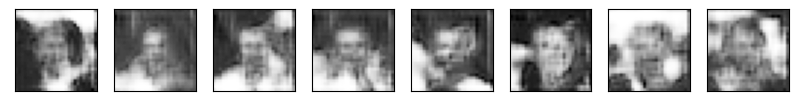

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 4400] D Loss: 0.6645; G Loss: 1.2298
1/1 [==============================] - 0s 10ms/step


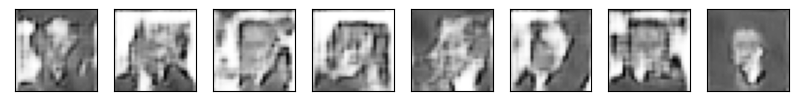

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 4600] D Loss: 0.1640; G Loss: 1.8862
1/1 [==============================] - 0s 10ms/step


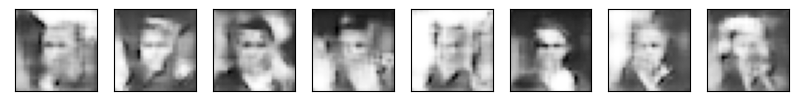

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 4800] D Loss: 0.4280; G Loss: 1.4245
1/1 [==============================] - 0s 10ms/step


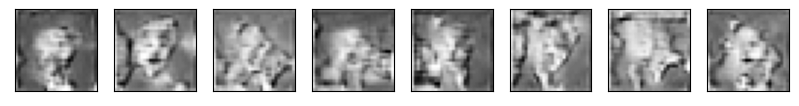

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 5000] D Loss: 0.5106; G Loss: 1.2677
1/1 [==============================] - 0s 11ms/step


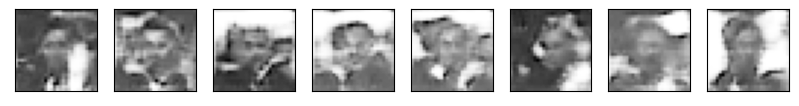

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 11ms/step
[Step 5200] D Loss: 0.6996; G Loss: 0.9870
1/1 [==============================] - 0s 10ms/step


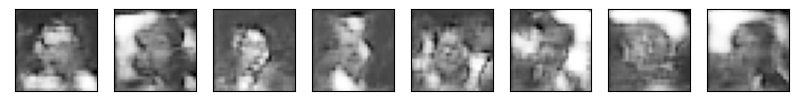

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 5400] D Loss: 0.7619; G Loss: 0.6531
1/1 [==============================] - 0s 10ms/step


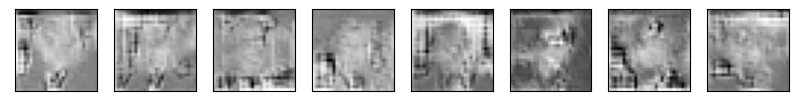

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 5600] D Loss: 0.6527; G Loss: 1.0710
1/1 [==============================] - 0s 10ms/step


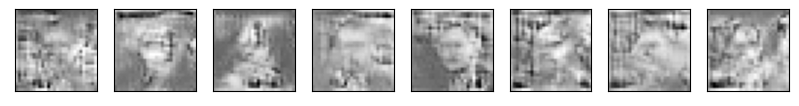

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 5800] D Loss: 0.5254; G Loss: 1.2958
1/1 [==============================] - 0s 10ms/step


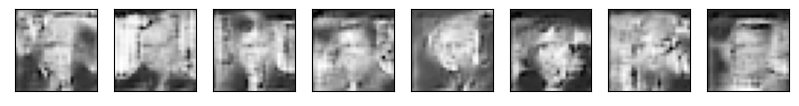

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 6000] D Loss: 0.4464; G Loss: 1.4556
1/1 [==============================] - 0s 10ms/step


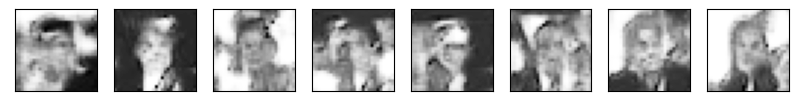

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 6200] D Loss: 0.5126; G Loss: 1.2784
1/1 [==============================] - 0s 10ms/step


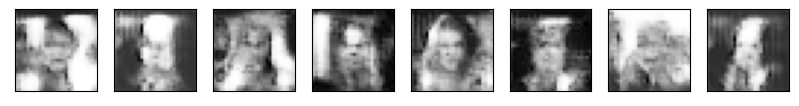

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 6400] D Loss: 0.5283; G Loss: 0.9027
1/1 [==============================] - 0s 10ms/step


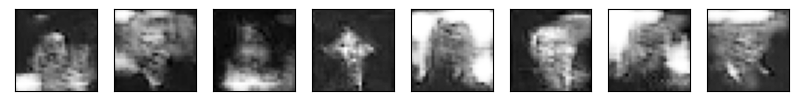

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 6600] D Loss: 0.4320; G Loss: 1.8764
1/1 [==============================] - 0s 10ms/step


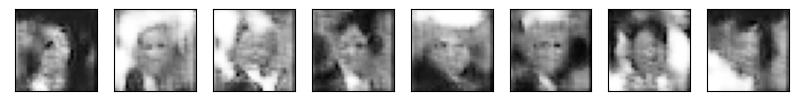

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 6800] D Loss: 0.4279; G Loss: 1.1859
1/1 [==============================] - 0s 10ms/step


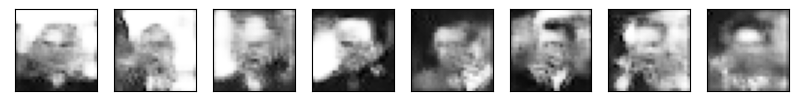

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 7000] D Loss: 1.0995; G Loss: 0.4686
1/1 [==============================] - 0s 11ms/step


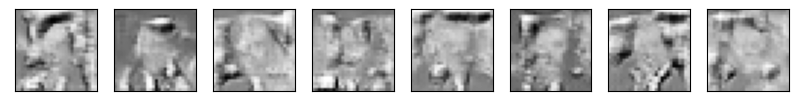

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 7200] D Loss: 0.8681; G Loss: 0.4818
1/1 [==============================] - 0s 10ms/step


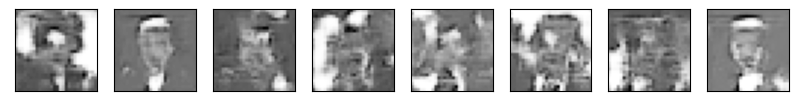

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 7400] D Loss: 0.6145; G Loss: 1.1038
1/1 [==============================] - 0s 10ms/step


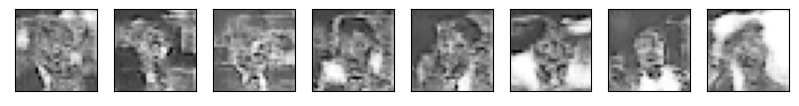

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 7600] D Loss: 0.4966; G Loss: 1.1558
1/1 [==============================] - 0s 10ms/step


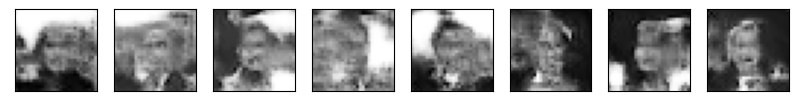

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 7800] D Loss: 0.5365; G Loss: 0.9263
1/1 [==============================] - 0s 10ms/step


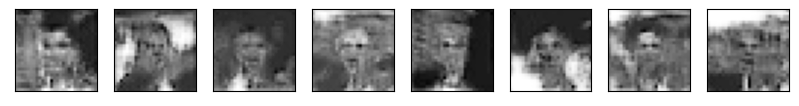

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 12ms/step
[Step 8000] D Loss: 0.6218; G Loss: 1.8698
1/1 [==============================] - 0s 11ms/step


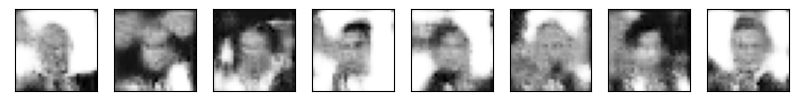

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 8200] D Loss: 0.4802; G Loss: 1.2978
1/1 [==============================] - 0s 10ms/step


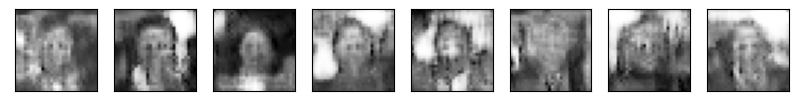

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 8400] D Loss: 0.4832; G Loss: 1.6206
1/1 [==============================] - 0s 10ms/step


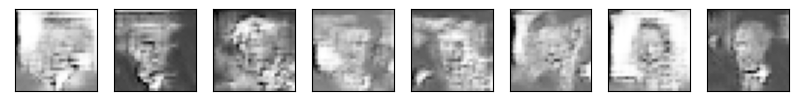

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 8600] D Loss: 0.5101; G Loss: 0.9711
1/1 [==============================] - 0s 10ms/step


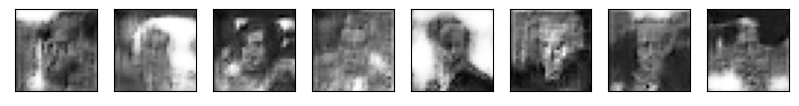

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 8800] D Loss: 0.5794; G Loss: 1.2417
1/1 [==============================] - 0s 10ms/step


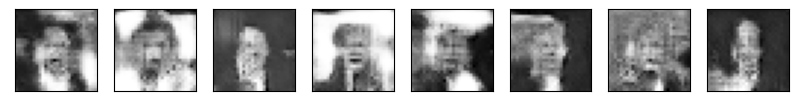

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 9000] D Loss: 0.6647; G Loss: 1.0964
1/1 [==============================] - 0s 10ms/step


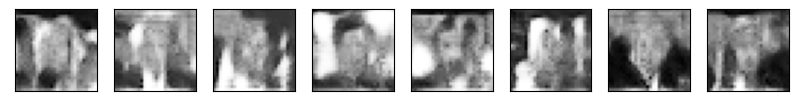

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 9200] D Loss: 0.5837; G Loss: 1.7127
1/1 [==============================] - 0s 10ms/step


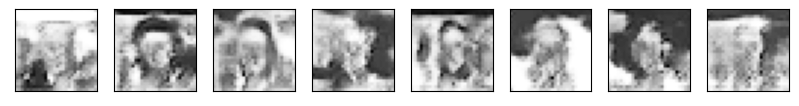

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 9400] D Loss: 0.6807; G Loss: 1.4843
1/1 [==============================] - 0s 11ms/step


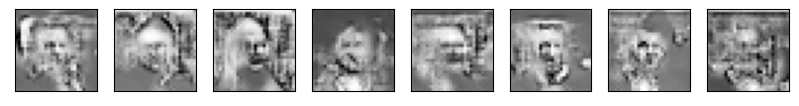

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 9600] D Loss: 0.6612; G Loss: 0.9874
1/1 [==============================] - 0s 11ms/step


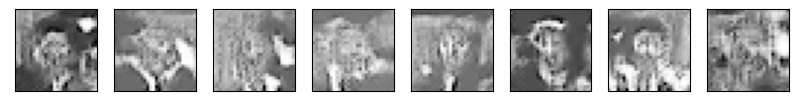

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 9800] D Loss: 0.5432; G Loss: 1.7361
1/1 [==============================] - 0s 10ms/step


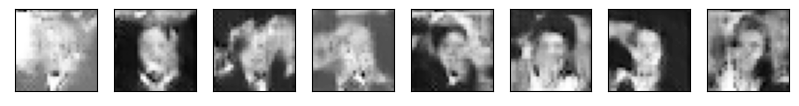

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 10000] D Loss: 0.4790; G Loss: 1.1890
1/1 [==============================] - 0s 10ms/step


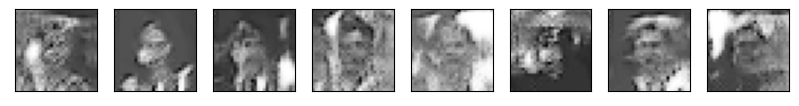

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 10200] D Loss: 0.5469; G Loss: 1.1054
1/1 [==============================] - 0s 10ms/step


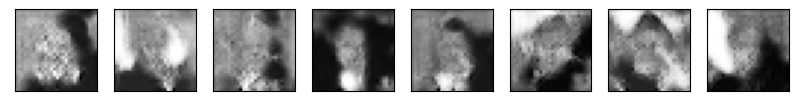

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 10400] D Loss: 0.3366; G Loss: 0.8900
1/1 [==============================] - 0s 10ms/step


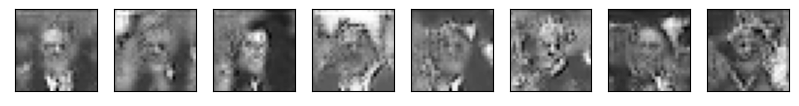

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 11ms/step
[Step 10600] D Loss: 0.5444; G Loss: 1.1129
1/1 [==============================] - 0s 10ms/step


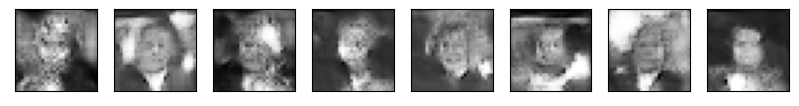

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 10800] D Loss: 0.7240; G Loss: 1.5166
1/1 [==============================] - 0s 10ms/step


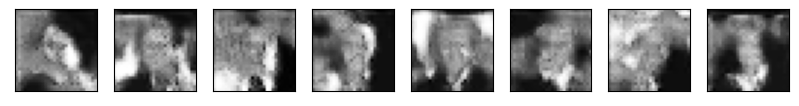

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 11000] D Loss: 0.9187; G Loss: 1.1130
1/1 [==============================] - 0s 12ms/step


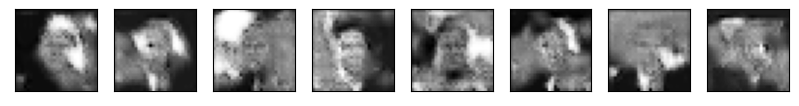

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 11200] D Loss: 0.5018; G Loss: 1.1648
1/1 [==============================] - 0s 10ms/step


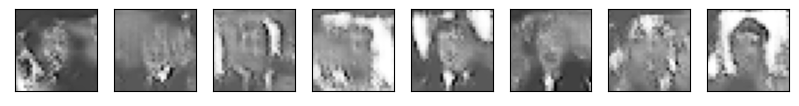

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 11400] D Loss: 0.3359; G Loss: 1.5448
1/1 [==============================] - 0s 10ms/step


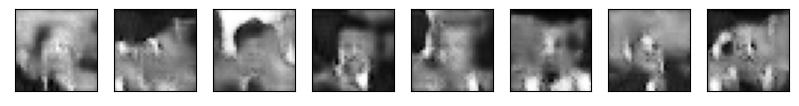

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 11600] D Loss: 0.5035; G Loss: 1.2048
1/1 [==============================] - 0s 10ms/step


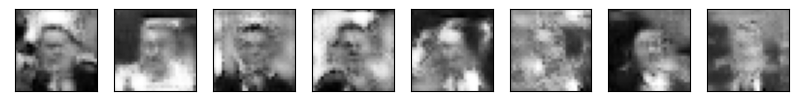

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 11800] D Loss: 0.6561; G Loss: 1.3235
1/1 [==============================] - 0s 11ms/step


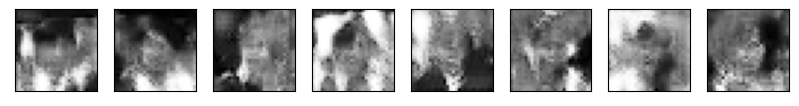

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 12000] D Loss: 0.6486; G Loss: 0.7998
1/1 [==============================] - 0s 10ms/step


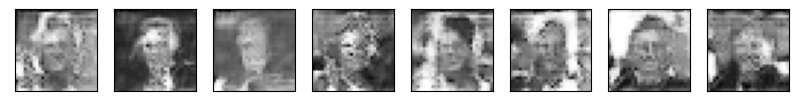

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 12200] D Loss: 0.8033; G Loss: 0.9499
1/1 [==============================] - 0s 10ms/step


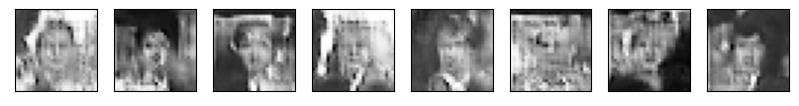

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 12400] D Loss: 0.7524; G Loss: 1.3086
1/1 [==============================] - 0s 11ms/step


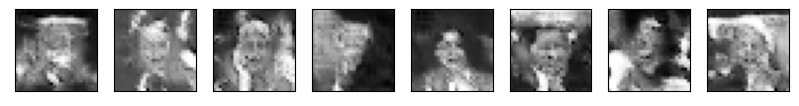

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 12600] D Loss: 0.5535; G Loss: 1.8886
1/1 [==============================] - 0s 11ms/step


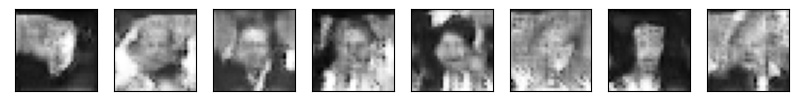

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 12800] D Loss: 0.5135; G Loss: 1.5612
1/1 [==============================] - 0s 10ms/step


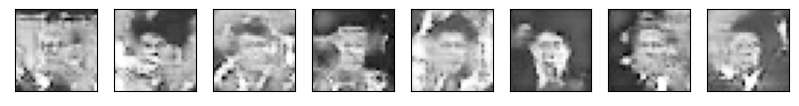

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 13000] D Loss: 0.6230; G Loss: 0.9067
1/1 [==============================] - 0s 10ms/step


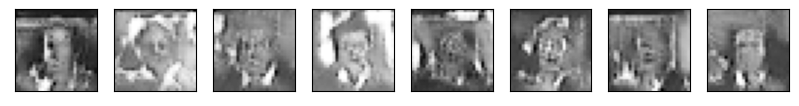

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 15ms/step
[Step 13200] D Loss: 0.4972; G Loss: 0.9893
1/1 [==============================] - 0s 11ms/step


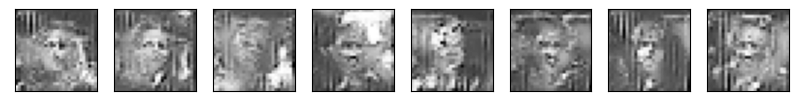

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 13400] D Loss: 0.7697; G Loss: 1.3745
1/1 [==============================] - 0s 10ms/step


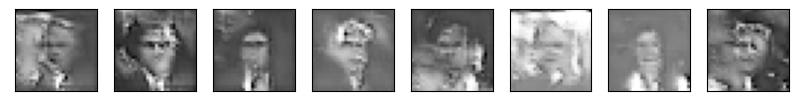

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 13600] D Loss: 0.4157; G Loss: 1.0827
1/1 [==============================] - 0s 10ms/step


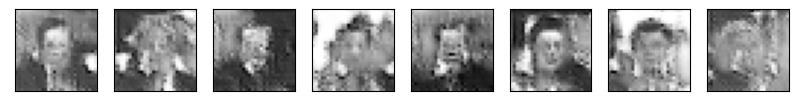

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 13800] D Loss: 0.5830; G Loss: 1.8640
1/1 [==============================] - 0s 10ms/step


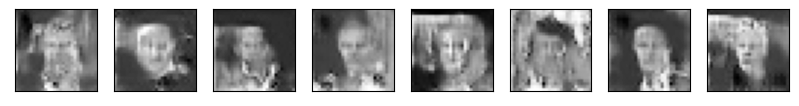

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 14000] D Loss: 0.9277; G Loss: 1.6697
1/1 [==============================] - 0s 10ms/step


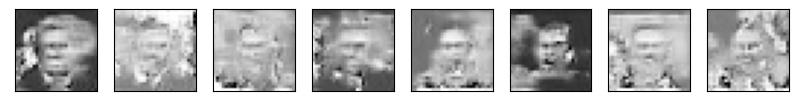

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 14200] D Loss: 1.0359; G Loss: 0.5872
1/1 [==============================] - 0s 10ms/step


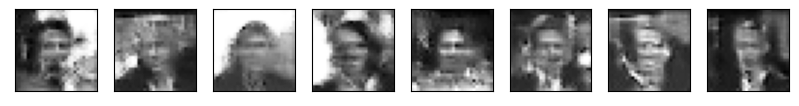

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 14400] D Loss: 0.7218; G Loss: 1.3328
1/1 [==============================] - 0s 10ms/step


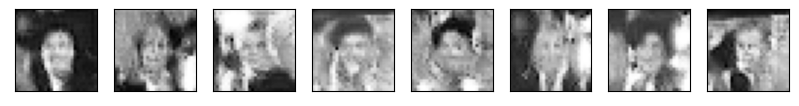

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 14600] D Loss: 0.6632; G Loss: 1.0219
1/1 [==============================] - 0s 10ms/step


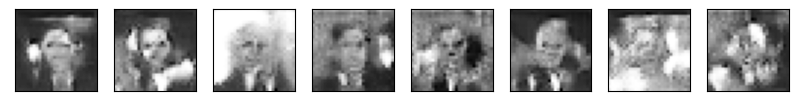

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 14800] D Loss: 0.5399; G Loss: 1.1381
1/1 [==============================] - 0s 11ms/step


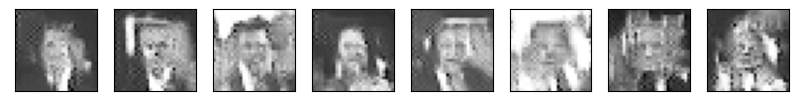

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 15000] D Loss: 0.5123; G Loss: 1.3725
1/1 [==============================] - 0s 10ms/step


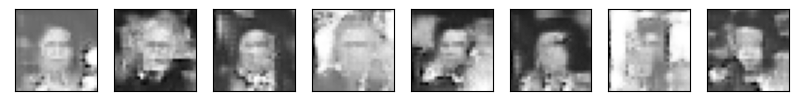

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 15200] D Loss: 0.4709; G Loss: 1.0861
1/1 [==============================] - 0s 10ms/step


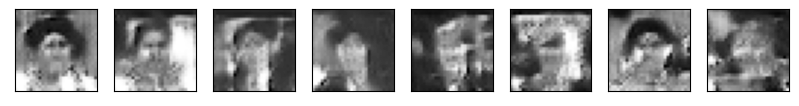

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 15400] D Loss: 0.3863; G Loss: 1.2260
1/1 [==============================] - 0s 10ms/step


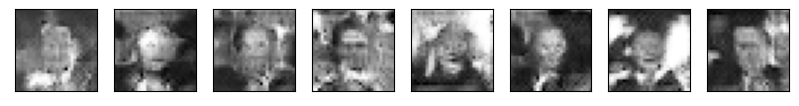

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 15600] D Loss: 0.5024; G Loss: 1.2595
1/1 [==============================] - 0s 11ms/step


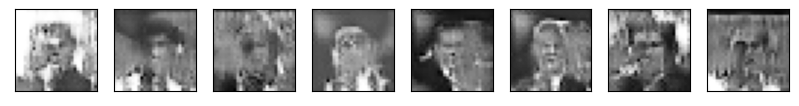

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 15800] D Loss: 0.5136; G Loss: 1.3058
1/1 [==============================] - 0s 10ms/step


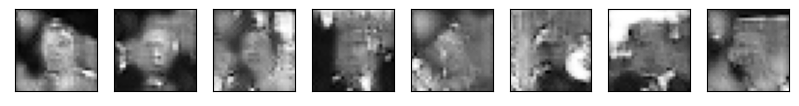

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 16000] D Loss: 0.4455; G Loss: 1.2262
1/1 [==============================] - 0s 10ms/step


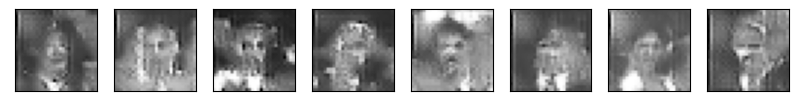

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 16200] D Loss: 0.5322; G Loss: 1.4524
1/1 [==============================] - 0s 10ms/step


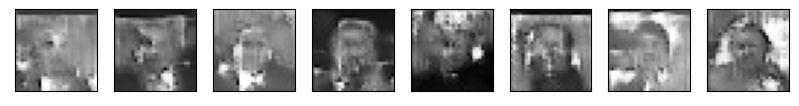

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 16400] D Loss: 0.9115; G Loss: 0.4784
1/1 [==============================] - 0s 10ms/step


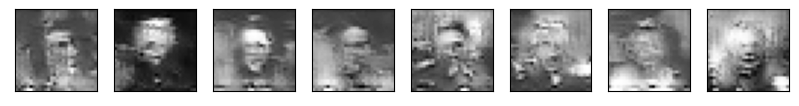

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 16600] D Loss: 0.5474; G Loss: 1.4379
1/1 [==============================] - 0s 10ms/step


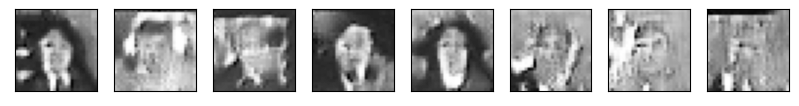

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 16800] D Loss: 0.4801; G Loss: 0.8778
1/1 [==============================] - 0s 10ms/step


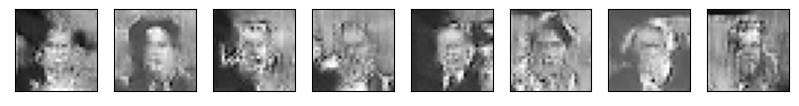

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 17000] D Loss: 0.6001; G Loss: 1.1050
1/1 [==============================] - 0s 10ms/step


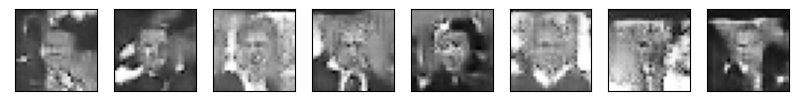

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 17200] D Loss: 0.6303; G Loss: 1.1121
1/1 [==============================] - 0s 11ms/step


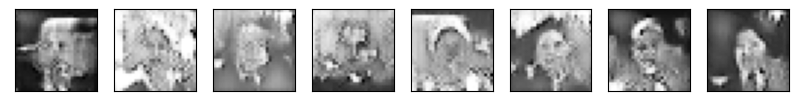

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 17400] D Loss: 0.6479; G Loss: 0.8542
1/1 [==============================] - 0s 10ms/step


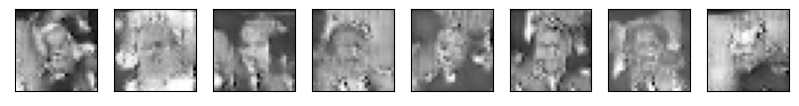

1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 10ms/step
[Step 17600] D Loss: 0.6147; G Loss: 0.8758
1/1 [==============================] - 0s 10ms/step


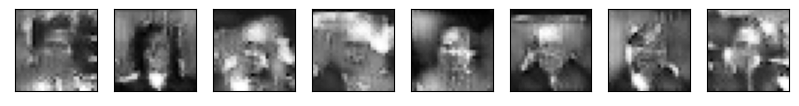

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 13ms/step
[Step 17800] D Loss: 0.3086; G Loss: 1.2700
1/1 [==============================] - 0s 14ms/step


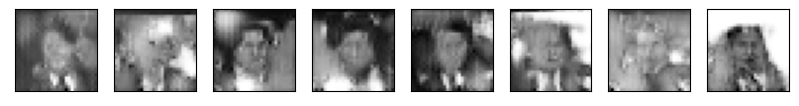

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 18000] D Loss: 0.5931; G Loss: 1.1928
1/1 [==============================] - 0s 11ms/step


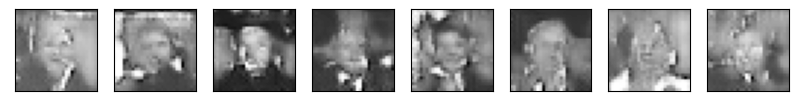

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 18200] D Loss: 0.6616; G Loss: 1.3047
1/1 [==============================] - 0s 10ms/step


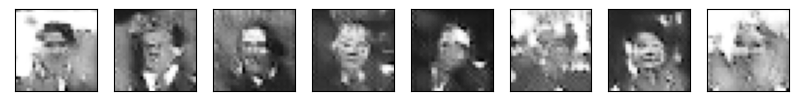

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 18400] D Loss: 0.6373; G Loss: 1.0008
1/1 [==============================] - 0s 10ms/step


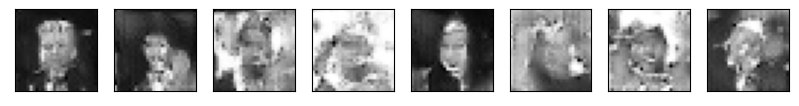

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 18600] D Loss: 0.6458; G Loss: 1.0636
1/1 [==============================] - 0s 11ms/step


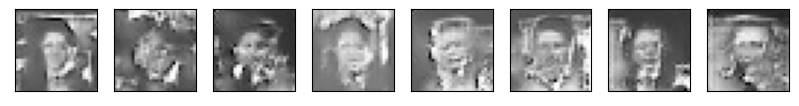

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 18800] D Loss: 0.5626; G Loss: 1.1574
1/1 [==============================] - 0s 10ms/step


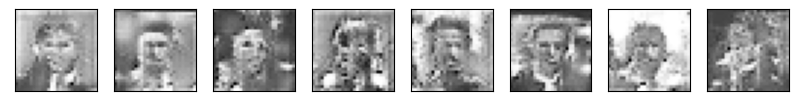

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 19000] D Loss: 0.6014; G Loss: 0.7826
1/1 [==============================] - 0s 10ms/step


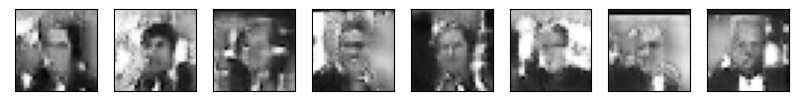

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 19200] D Loss: 0.6539; G Loss: 1.1732
1/1 [==============================] - 0s 10ms/step


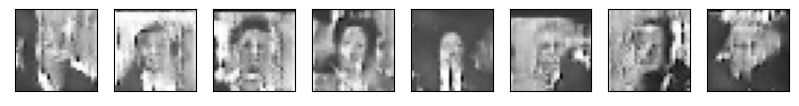

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 19400] D Loss: 0.7004; G Loss: 0.9453
1/1 [==============================] - 0s 44ms/step


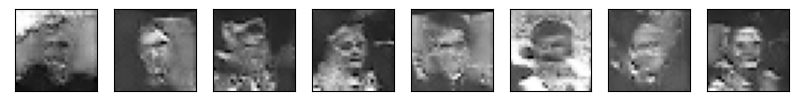

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 19600] D Loss: 0.4796; G Loss: 1.1308
1/1 [==============================] - 0s 10ms/step


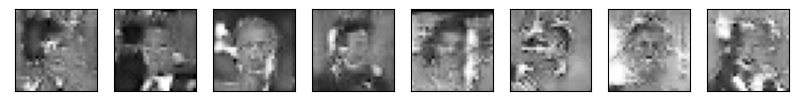

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 19800] D Loss: 0.5911; G Loss: 0.8646
1/1 [==============================] - 0s 11ms/step


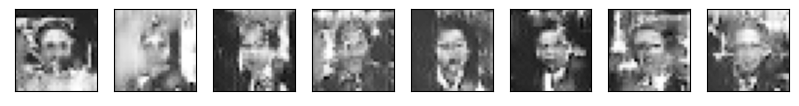

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 20000] D Loss: 0.7423; G Loss: 1.0438
1/1 [==============================] - 0s 10ms/step


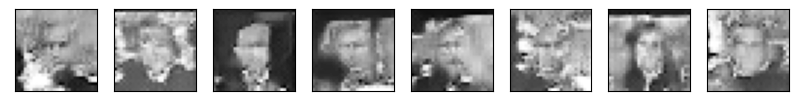

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 20200] D Loss: 0.6129; G Loss: 1.3673
1/1 [==============================] - 0s 10ms/step


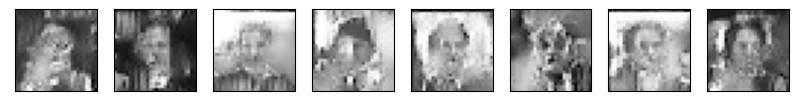

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 20400] D Loss: 0.5429; G Loss: 0.8599
1/1 [==============================] - 0s 10ms/step


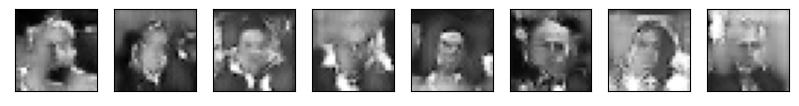

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 20600] D Loss: 0.7222; G Loss: 1.1543
1/1 [==============================] - 0s 11ms/step


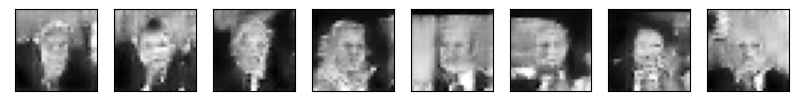

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 20800] D Loss: 0.6633; G Loss: 1.0871
1/1 [==============================] - 0s 11ms/step


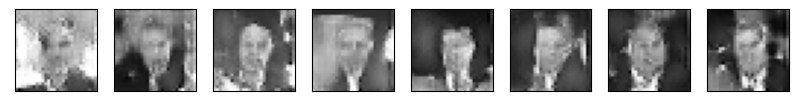

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 21000] D Loss: 0.6576; G Loss: 0.8653
1/1 [==============================] - 0s 10ms/step


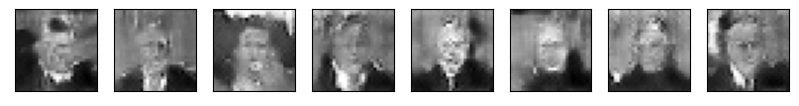

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 21200] D Loss: 0.6122; G Loss: 1.1873
1/1 [==============================] - 0s 10ms/step


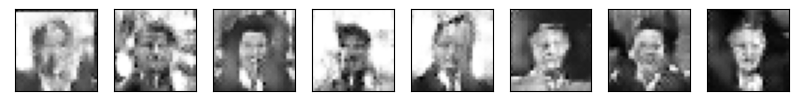

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 11ms/step
[Step 21400] D Loss: 0.6033; G Loss: 0.9473
1/1 [==============================] - 0s 11ms/step


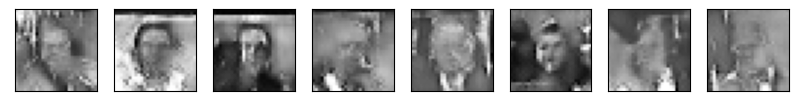

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 21600] D Loss: 0.6679; G Loss: 0.9289
1/1 [==============================] - 0s 10ms/step


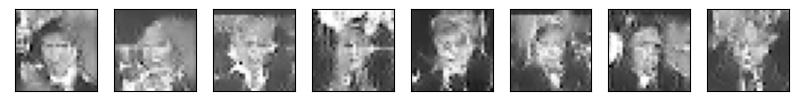

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 21800] D Loss: 0.6983; G Loss: 0.9685
1/1 [==============================] - 0s 10ms/step


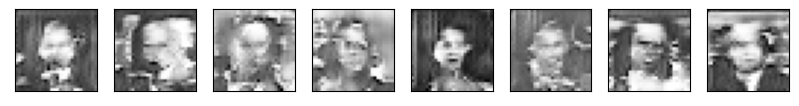

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 22000] D Loss: 0.7110; G Loss: 0.5785
1/1 [==============================] - 0s 10ms/step


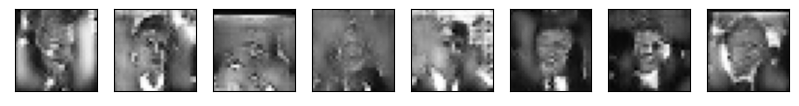

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 22200] D Loss: 0.6360; G Loss: 0.9449
1/1 [==============================] - 0s 10ms/step


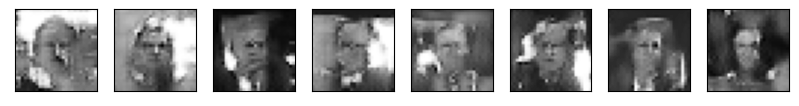

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 22400] D Loss: 0.7203; G Loss: 0.5840
1/1 [==============================] - 0s 11ms/step


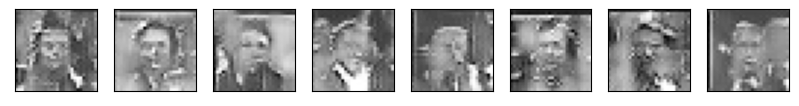

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 11ms/step
[Step 22600] D Loss: 0.6247; G Loss: 0.7868
1/1 [==============================] - 0s 10ms/step


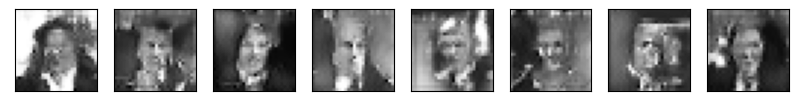

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 22800] D Loss: 0.4945; G Loss: 1.0797
1/1 [==============================] - 0s 11ms/step


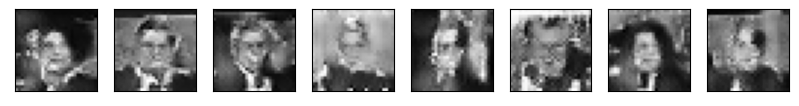

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 23000] D Loss: 0.6998; G Loss: 0.8731
1/1 [==============================] - 0s 10ms/step


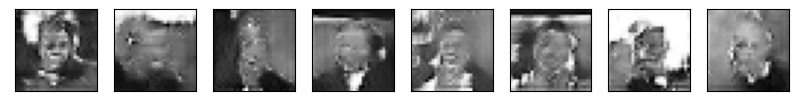

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 23200] D Loss: 0.7508; G Loss: 1.0036
1/1 [==============================] - 0s 10ms/step


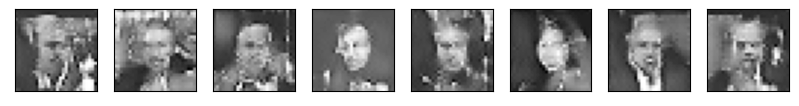

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 23400] D Loss: 0.5435; G Loss: 1.1459
1/1 [==============================] - 0s 10ms/step


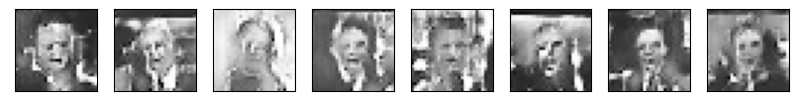

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 23600] D Loss: 0.7280; G Loss: 1.0689
1/1 [==============================] - 0s 10ms/step


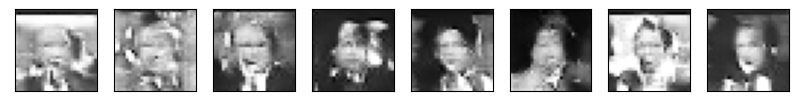

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 23800] D Loss: 0.6623; G Loss: 1.0367
1/1 [==============================] - 0s 10ms/step


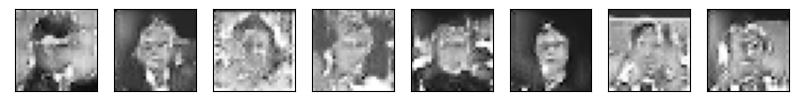

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 24000] D Loss: 0.7789; G Loss: 0.5025
1/1 [==============================] - 0s 10ms/step


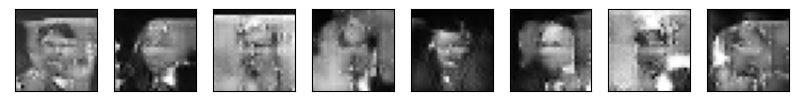

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 24200] D Loss: 0.7720; G Loss: 0.7233
1/1 [==============================] - 0s 10ms/step


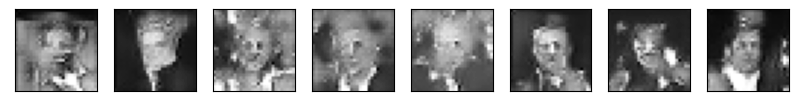

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 24400] D Loss: 0.6828; G Loss: 0.5444
1/1 [==============================] - 0s 10ms/step


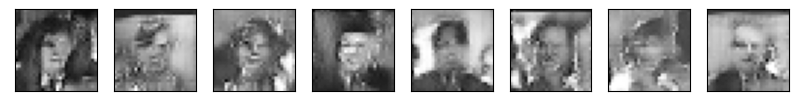

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 24600] D Loss: 0.7269; G Loss: 0.9681
1/1 [==============================] - 0s 10ms/step


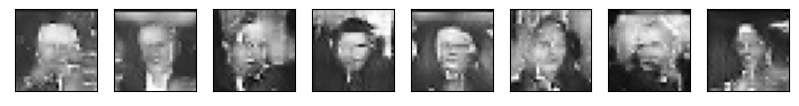

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 24800] D Loss: 0.6251; G Loss: 1.0434
1/1 [==============================] - 0s 10ms/step


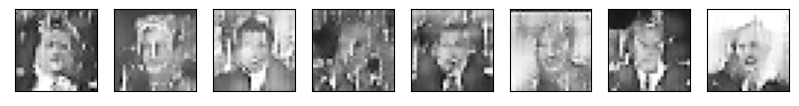

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 25000] D Loss: 0.6788; G Loss: 0.9230
1/1 [==============================] - 0s 10ms/step


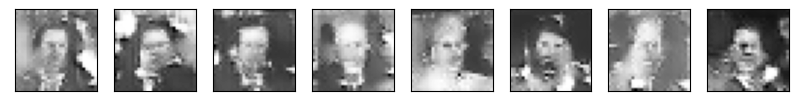

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 25200] D Loss: 0.5354; G Loss: 0.9435
1/1 [==============================] - 0s 10ms/step


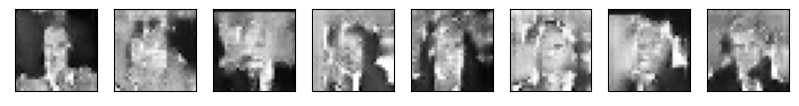

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 25400] D Loss: 0.7673; G Loss: 0.9774
1/1 [==============================] - 0s 11ms/step


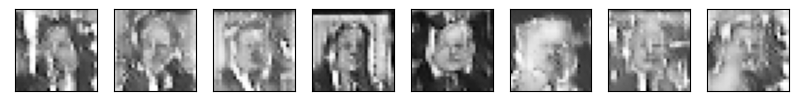

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 25600] D Loss: 0.6362; G Loss: 0.6547
1/1 [==============================] - 0s 10ms/step


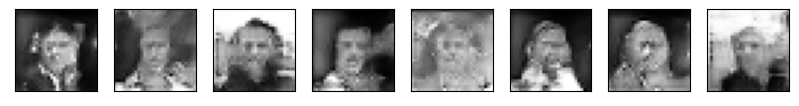

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 25800] D Loss: 0.5983; G Loss: 0.5624
1/1 [==============================] - 0s 10ms/step


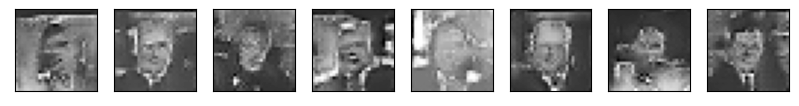

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 26000] D Loss: 0.5452; G Loss: 1.3151
1/1 [==============================] - 0s 10ms/step


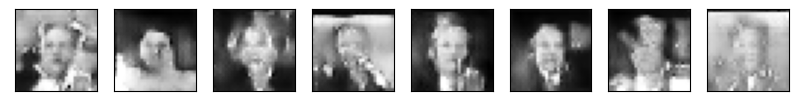

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 26200] D Loss: 0.9891; G Loss: 0.5161
1/1 [==============================] - 0s 10ms/step


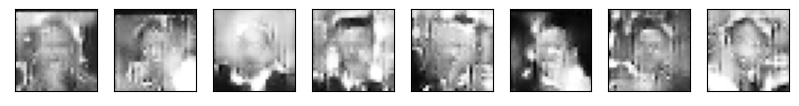

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 26400] D Loss: 0.8968; G Loss: 0.9868
1/1 [==============================] - 0s 10ms/step


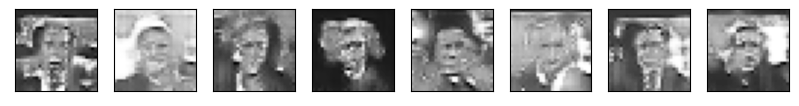

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 26600] D Loss: 0.6811; G Loss: 0.8431
1/1 [==============================] - 0s 10ms/step


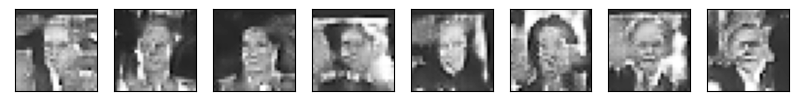

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 26800] D Loss: 0.6130; G Loss: 0.8268
1/1 [==============================] - 0s 10ms/step


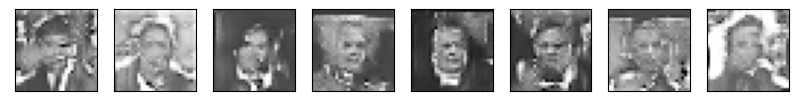

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 27000] D Loss: 0.6587; G Loss: 0.8315
1/1 [==============================] - 0s 10ms/step


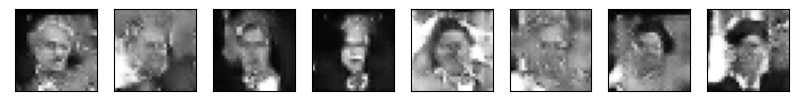

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 27200] D Loss: 0.6374; G Loss: 0.9080
1/1 [==============================] - 0s 10ms/step


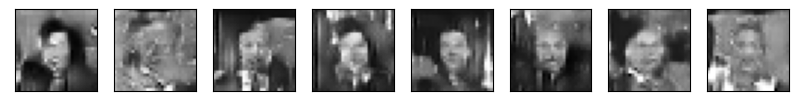

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 27400] D Loss: 0.6300; G Loss: 0.9436
1/1 [==============================] - 0s 10ms/step


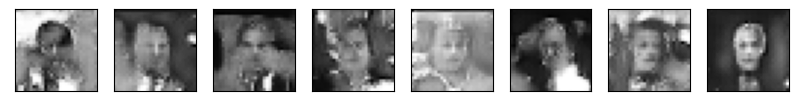

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 27600] D Loss: 0.6482; G Loss: 0.8229
1/1 [==============================] - 0s 10ms/step


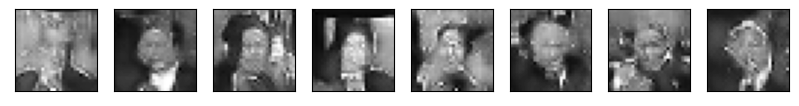

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 27800] D Loss: 0.6605; G Loss: 0.6770
1/1 [==============================] - 0s 10ms/step


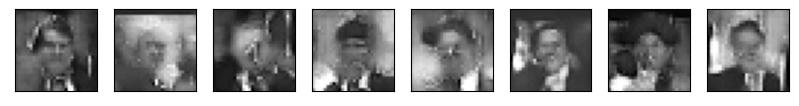

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 28000] D Loss: 0.5781; G Loss: 1.0746
1/1 [==============================] - 0s 11ms/step


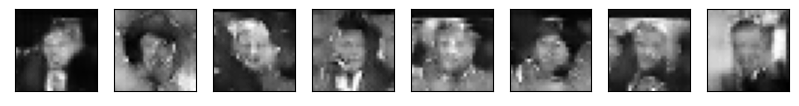

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 28200] D Loss: 0.5720; G Loss: 0.7421
1/1 [==============================] - 0s 10ms/step


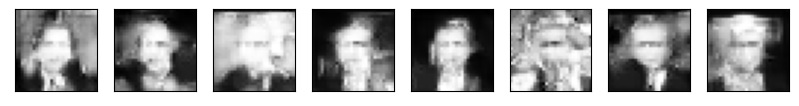

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 28400] D Loss: 0.6566; G Loss: 0.7179
1/1 [==============================] - 0s 11ms/step


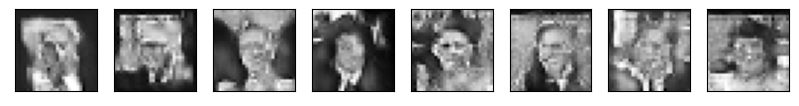

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 34ms/step
[Step 28600] D Loss: 0.5914; G Loss: 0.9521
1/1 [==============================] - 0s 10ms/step


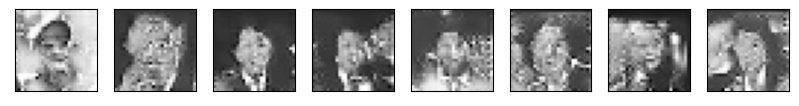

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 28800] D Loss: 0.7050; G Loss: 0.6309
1/1 [==============================] - 0s 10ms/step


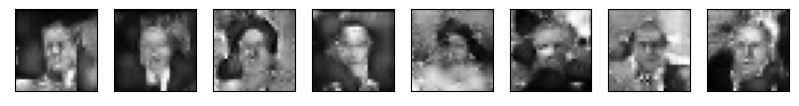

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 29000] D Loss: 0.6047; G Loss: 0.8652
1/1 [==============================] - 0s 10ms/step


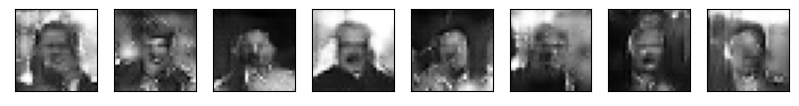

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 29200] D Loss: 0.6182; G Loss: 0.9099
1/1 [==============================] - 0s 10ms/step


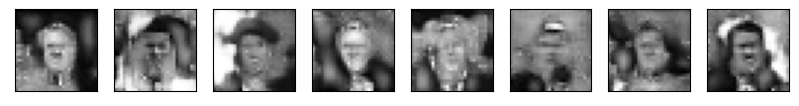

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 29400] D Loss: 0.5830; G Loss: 0.7511
1/1 [==============================] - 0s 10ms/step


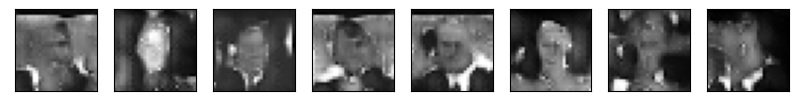

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 29600] D Loss: 0.6860; G Loss: 0.6810
1/1 [==============================] - 0s 10ms/step


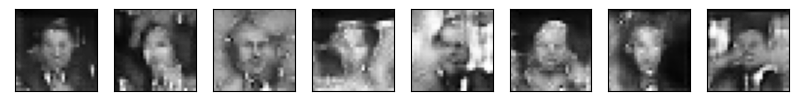

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 29800] D Loss: 0.8028; G Loss: 0.6427
1/1 [==============================] - 0s 10ms/step


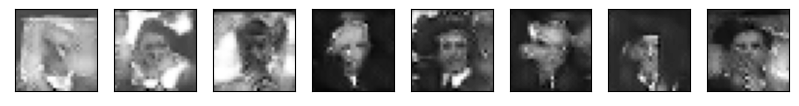

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 30000] D Loss: 0.7190; G Loss: 0.7735
1/1 [==============================] - 0s 10ms/step


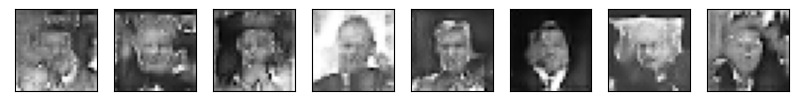

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 30200] D Loss: 0.6184; G Loss: 0.8285
1/1 [==============================] - 0s 10ms/step


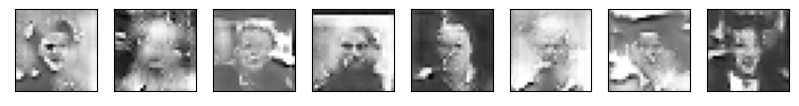

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 30400] D Loss: 0.6029; G Loss: 1.1673
1/1 [==============================] - 0s 10ms/step


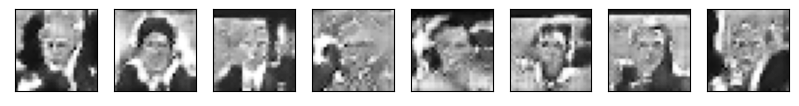

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 30600] D Loss: 0.6772; G Loss: 1.1304
1/1 [==============================] - 0s 10ms/step


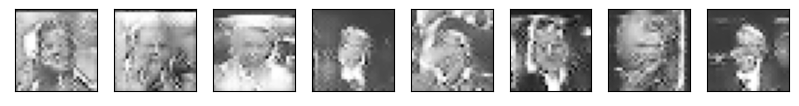

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 30800] D Loss: 0.5949; G Loss: 1.1301
1/1 [==============================] - 0s 10ms/step


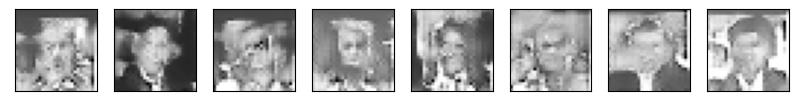

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 31000] D Loss: 0.6680; G Loss: 0.8396
1/1 [==============================] - 0s 10ms/step


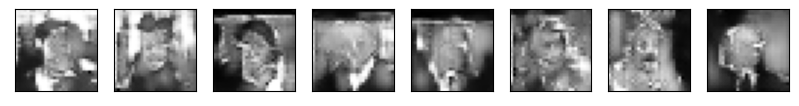

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 31200] D Loss: 0.6630; G Loss: 0.7938
1/1 [==============================] - 0s 10ms/step


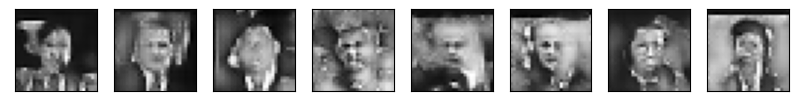

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 11ms/step
[Step 31400] D Loss: 0.6072; G Loss: 0.9588
1/1 [==============================] - 0s 11ms/step


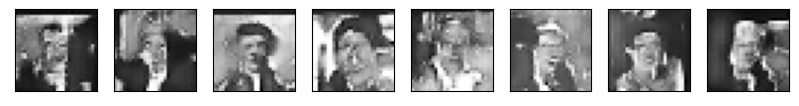

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 31600] D Loss: 0.8406; G Loss: 0.6226
1/1 [==============================] - 0s 10ms/step


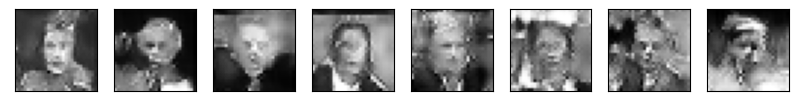

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 31800] D Loss: 0.7625; G Loss: 0.6827
1/1 [==============================] - 0s 10ms/step


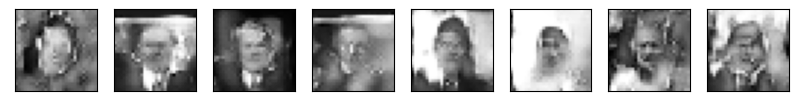

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 32000] D Loss: 0.4721; G Loss: 0.8271
1/1 [==============================] - 0s 11ms/step


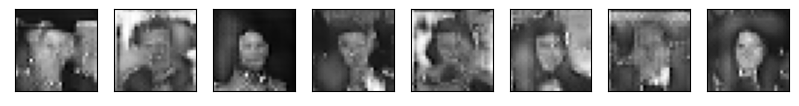

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 32200] D Loss: 0.7297; G Loss: 0.7541
1/1 [==============================] - 0s 10ms/step


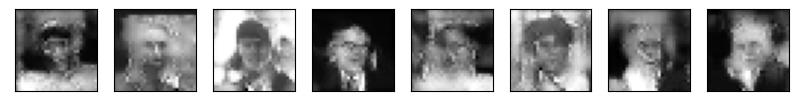

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 32400] D Loss: 0.6943; G Loss: 0.4565
1/1 [==============================] - 0s 10ms/step


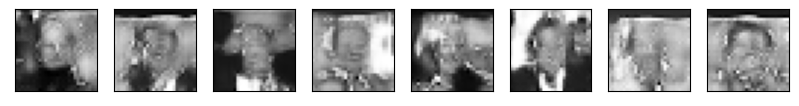

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 11ms/step
[Step 32600] D Loss: 0.5989; G Loss: 0.8254
1/1 [==============================] - 0s 10ms/step


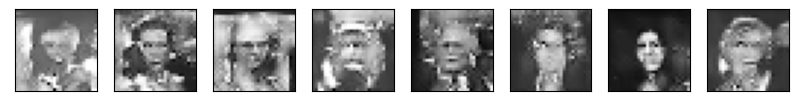

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 32800] D Loss: 0.5218; G Loss: 1.0096
1/1 [==============================] - 0s 11ms/step


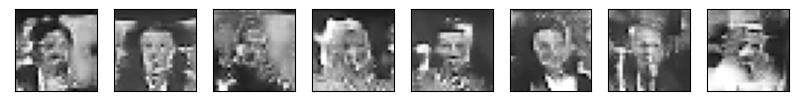

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 33000] D Loss: 0.6519; G Loss: 0.9202
1/1 [==============================] - 0s 10ms/step


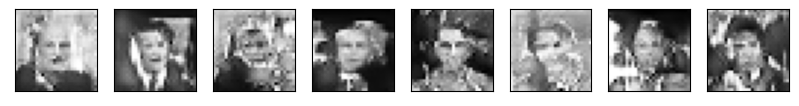

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 33200] D Loss: 0.5545; G Loss: 0.9517
1/1 [==============================] - 0s 10ms/step


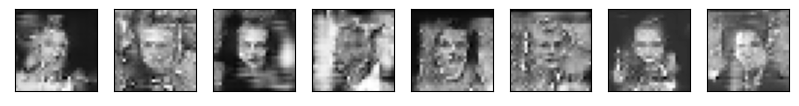

1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 10ms/step
[Step 33400] D Loss: 0.6888; G Loss: 0.6978
1/1 [==============================] - 0s 10ms/step


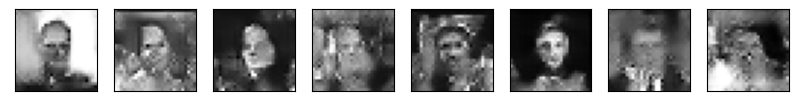

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step
[Step 33600] D Loss: 0.7159; G Loss: 0.7660
1/1 [==============================] - 0s 19ms/step


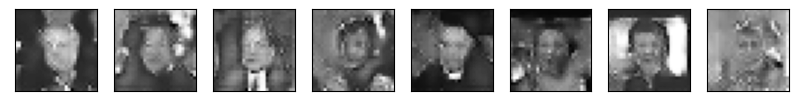

1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step
[Step 33800] D Loss: 0.6354; G Loss: 0.8372
1/1 [==============================] - 0s 10ms/step


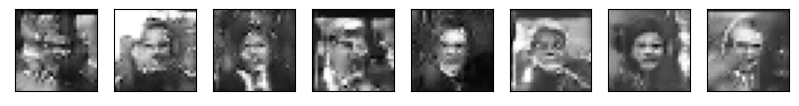

1/1 [==============================] - 0s 10ms/step


KeyboardInterrupt: 

In [67]:
for step, true_images in enumerate(train_ds):
    
    # Train Discriminator
    
    noise = np.random.normal(0, 1, (HALF_BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    syntetic_images = generator.predict(noise)
    x_combined = np.concatenate((
        true_images, 
        syntetic_images))
    y_combined = np.concatenate((
        np.ones((HALF_BATCH_SIZE, 1), np.float32), 
        np.zeros((HALF_BATCH_SIZE, 1), np.float32)))
    
    with tf.GradientTape() as tape:
        logits = discriminator(x_combined, training=True)
        d_loss_value = sigmoid_cross_entropy(y_combined, logits)
    grads = tape.gradient(d_loss_value, discriminator.trainable_variables)
   
    vd = zip(grads, discriminator.trainable_variables)
   
    optimizer.apply_gradients(vd)
    
    # Train Generator
    
    noise = np.random.normal(0, 1, (BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    y_mislabled = np.ones((BATCH_SIZE, 1), np.float32)
    
    with tf.GradientTape() as tape:
        syntetic = generator(noise, training=True)
        logits = discriminator(syntetic, training=False)
        g_loss_value = sigmoid_cross_entropy(y_mislabled, logits)
    grads = tape.gradient(g_loss_value, generator.trainable_variables)
    
    
    vg = zip(grads, generator.trainable_variables)
  
    
    optimizer.apply_gradients(vg)
    
    # Check intermediate results
    
    if step % 200 == 0:
        print('[Step %2d] D Loss: %.4f; G Loss: %.4f' % (
            step, d_loss_value.numpy(), g_loss_value.numpy()))
        noise = np.random.normal(0, 1, (8, INPUT_DIM)).astype(np.float32)
        syntetic_images = generator.predict(noise)
        plot_digits(syntetic_images)


1/1 [==============================] - 0s 13ms/step


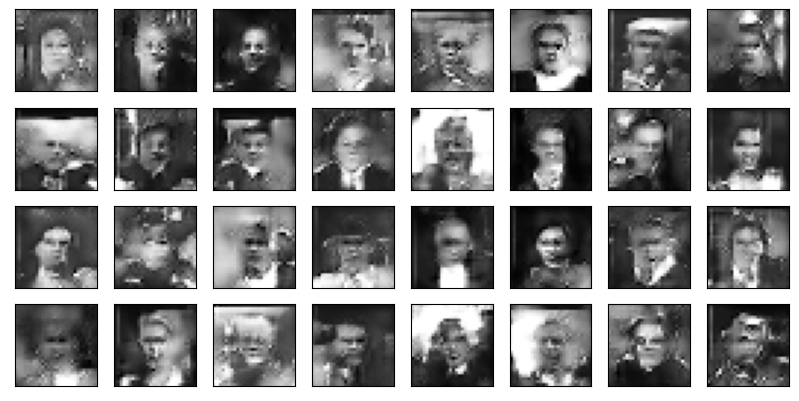

In [68]:
noise = np.random.normal(0, 1, (32, INPUT_DIM)).astype(np.float32)
syntetic_images = generator.predict(noise)
plot_digits(syntetic_images)